In [45]:
# importing the libraries used

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from xgboost import XGBRegressor
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX
import seaborn as sns

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

from sklearn.metrics import mean_squared_error

from PIL import Image
from IPython.display import display

# Showing the map of Hungary:

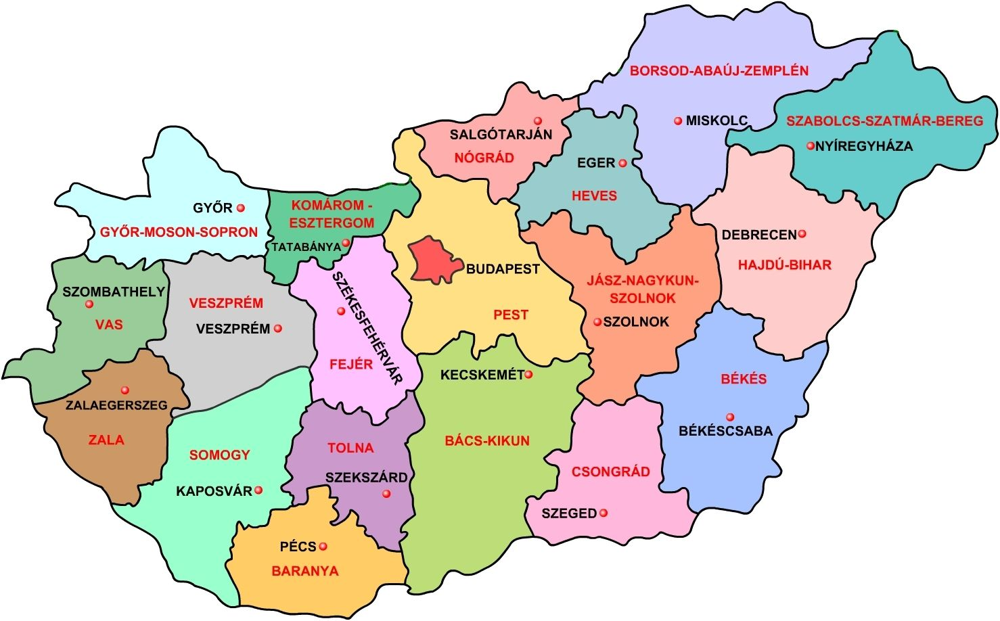

In [46]:
path="hungary.jpg"

display(Image.open(path))

# Creating the adjacency matrix:

In [47]:
# Load the dataset
spatial = pd.read_csv('hungary_county_edges.csv')
spatial.head()

,name_1,name_2,id_1,id_2
0,BACS,JASZ,0,10
1,BACS,BACS,0,0
2,BACS,BARANYA,0,1
3,BACS,CSONGRAD,0,5
4,BACS,PEST,0,13


In [48]:
spatial_matrix = {'County': spatial['name_1'].unique()}
spatial_matrix = pd.DataFrame(spatial_matrix)

spatial_matrix

,County
0,BACS
1,BARANYA
2,BEKES
3,BORSOD
4,BUDAPEST
5,CSONGRAD
6,FEJER
7,GYOR
8,HAJDU
9,HEVES


In [49]:
county_dict = {}

for county in spatial['name_1'].unique():
    spatial_matrix[county] = np.zeros(20)

spatial_matrix.head()

,County,BACS,BARANYA,BEKES,BORSOD,BUDAPEST,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,BACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,BARANYA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,BEKES,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,BORSOD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,BUDAPEST,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
county_list = spatial['name_1'].unique().tolist()

boundary_sharing = {}

for county in county_list:
    boundary_sharing[county] = spatial[spatial['name_1'] == county]['name_2'].tolist()
    
for county1 in county_list:
    for county2 in boundary_sharing[county1]:
        spatial_matrix.at[spatial_matrix.County[spatial_matrix.County == county1].index.tolist()[0], county2] = 1

spatial_matrix

,County,BACS,BARANYA,BEKES,BORSOD,BUDAPEST,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,BACS,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,BARANYA,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
2,BEKES,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,BORSOD,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,BUDAPEST,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5,CSONGRAD,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,FEJER,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
7,GYOR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
8,HAJDU,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
9,HEVES,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


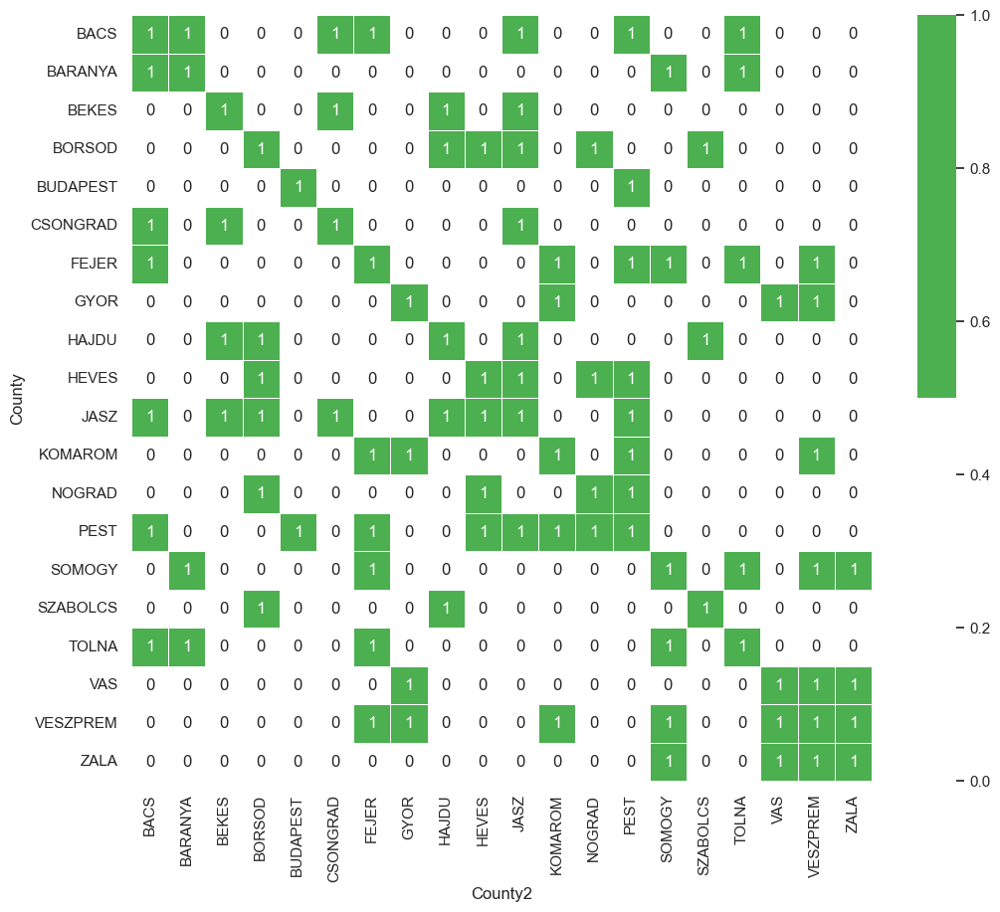

In [51]:
# Create a pivot table for better visualization
pivot_spatial_matrix = spatial_matrix.melt(id_vars='County', var_name='County2', value_name='Value')
heatmap_data = pivot_spatial_matrix.pivot_table(index='County', columns='County2', values='Value')

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Define a custom color palette (for 1s with themselves and 1s with other counties)
cmap = sns.color_palette(["#ffffff", "#4CAF50"])

# Create a heatmap with seaborn using the custom color palette
sns.heatmap(heatmap_data, cmap=cmap, annot=True, fmt=".0f", linewidths=.5)

# Add legend
legend_labels = ['No Connection', 'Connection']

# Display the plot
plt.show()

# Working on the temporal dataset:

In [52]:
df = pd.read_csv('hungary_chickenpox.csv')

df.head()

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,130,57,2,178,66,64,11,29,87,68
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,80,50,29,141,48,29,58,53,68,26
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,64,46,4,157,33,33,24,18,62,44
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,63,54,14,107,66,50,25,21,43,31
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,61,49,11,124,63,56,7,47,85,60


### Checking the correlation of the cases in the counties for comparison

<Axes: >

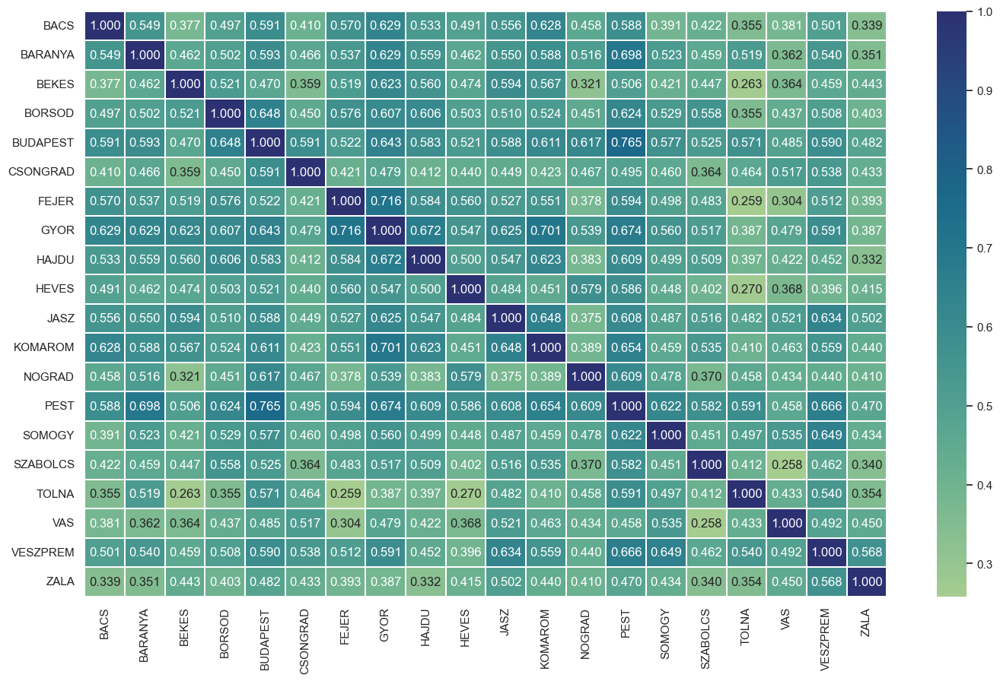

In [53]:
corr = df[[county for county in county_list]].corr()

plt.figure(figsize = (17,10))

sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True,
            cmap='crest',
            fmt='.3f',
            linewidth=.02)

### Getting Graphs of the data of all counties:

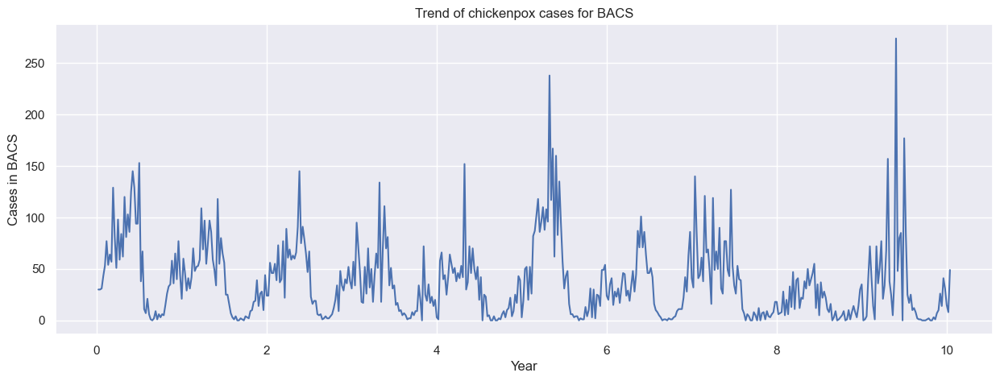

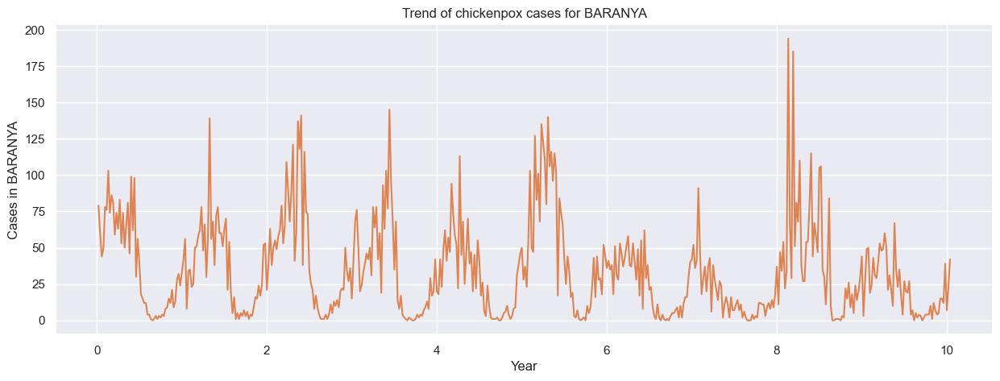

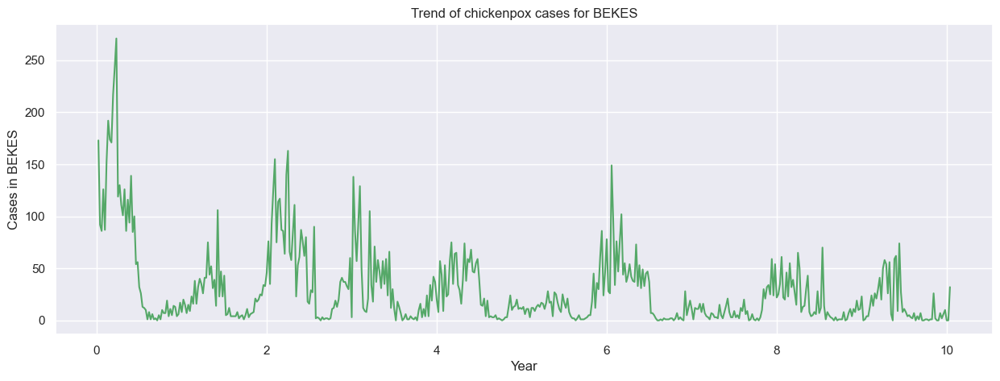

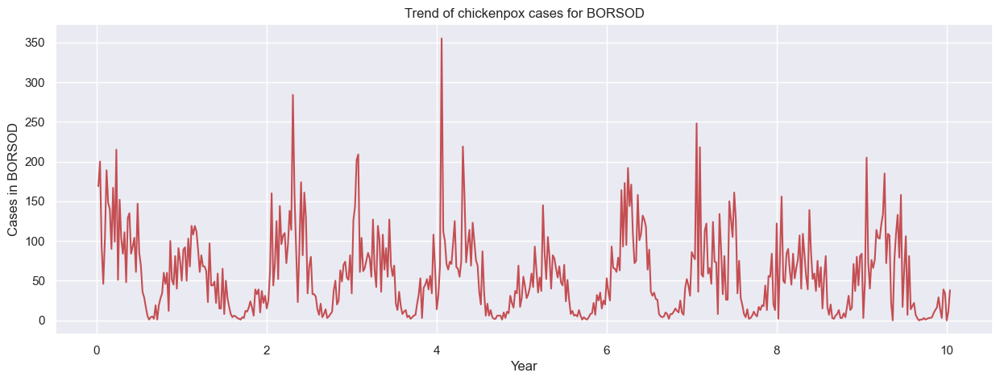

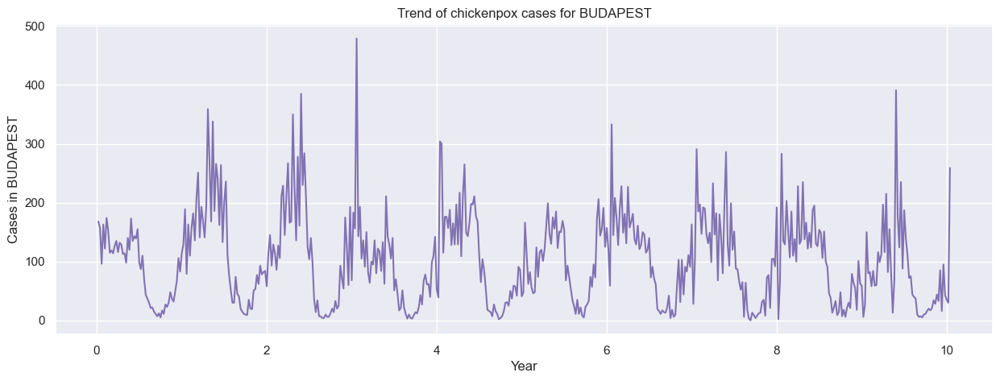

...

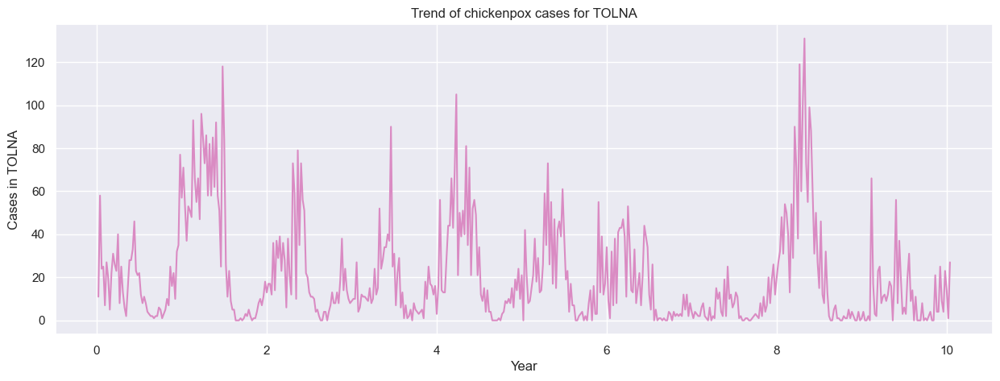

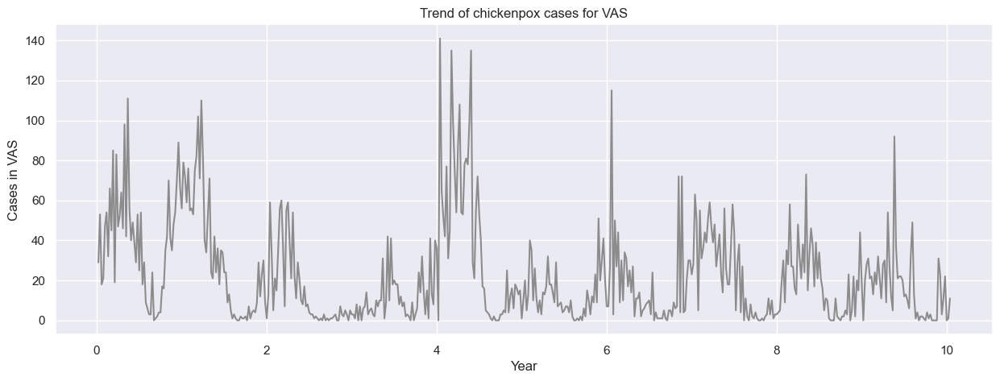

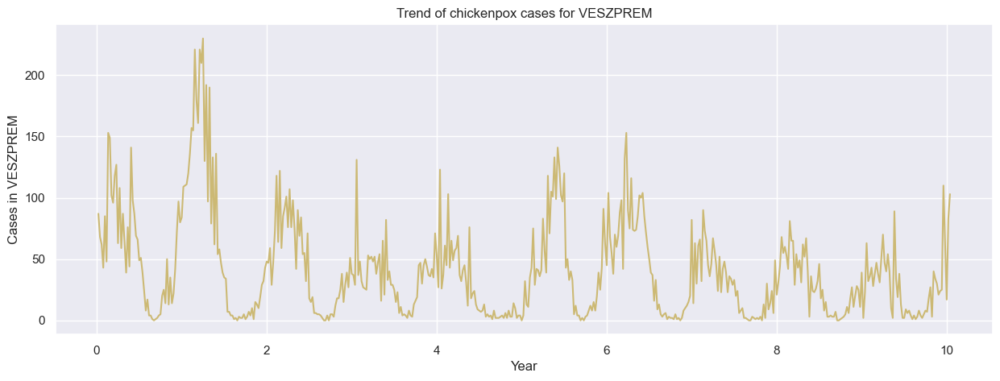

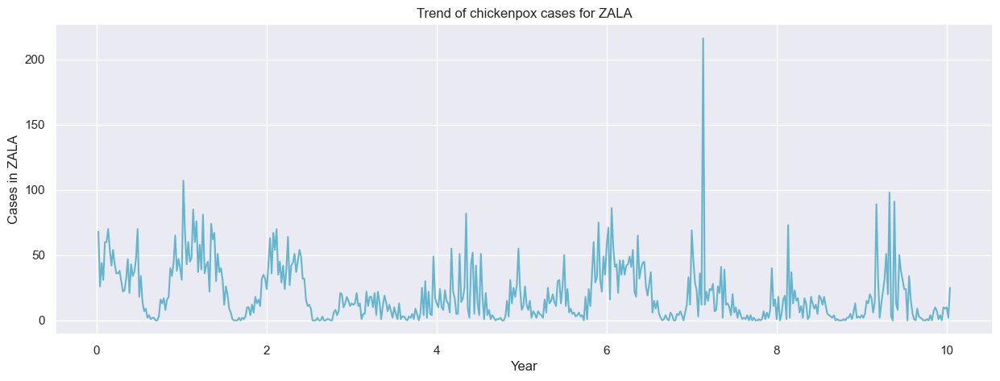

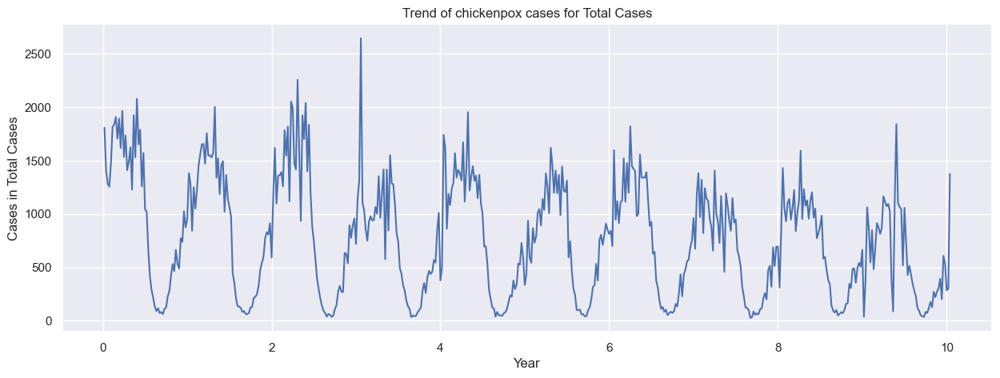

In [54]:
df.insert(0, "Week", [i for i in range(1, len(df) + 1)])
df['Total Cases'] = df[[county for county in county_list]].sum(axis=1)

county_list.append('Total Cases')

# Set the figure size
sns.set(rc={'figure.figsize': (15, 5)})

# Get a palette with more colors
palette = sns.color_palette("deep", len(county_list))

# Create line plots with different colors
for i, county in enumerate(county_list):
    sns.lineplot(y=df[county].to_list(), x=(df['Week'] / 52).to_list(), color=palette[i])

    # Set labels and title
    plt.xlabel("Year")
    plt.ylabel(f"Cases in {county}")

    plt.title(f"Trend of chickenpox cases for {county}")

    # Display the plot
    plt.show()

# Training

In [55]:
train_set, test_set= np.split(df, [int(.9 *len(df))])

len(train_set), len(test_set)

(469, 53)

### Prophet

16:48:43 - cmdstanpy - INFO - Chain [1] start processing
16:48:43 - cmdstanpy - INFO - Chain [1] done processing


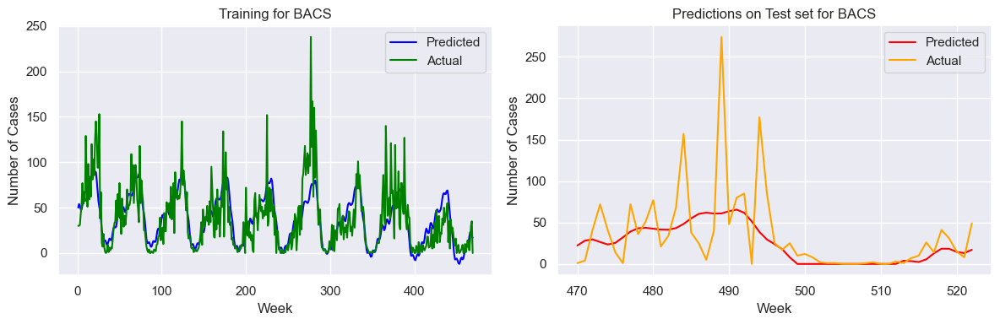

16:48:44 - cmdstanpy - INFO - Chain [1] start processing
16:48:44 - cmdstanpy - INFO - Chain [1] done processing


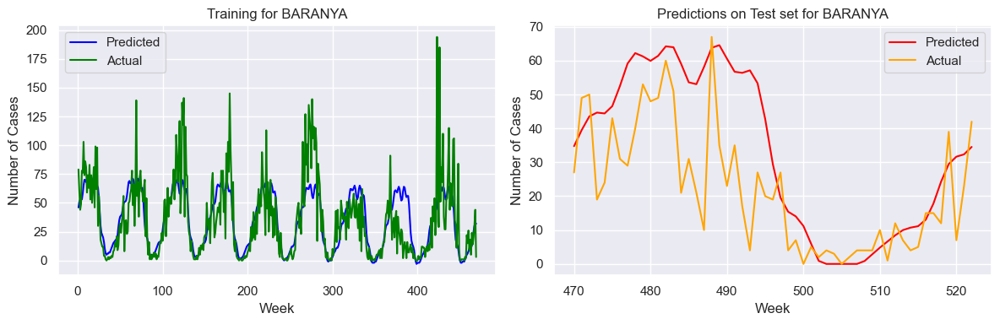

16:48:45 - cmdstanpy - INFO - Chain [1] start processing
16:48:46 - cmdstanpy - INFO - Chain [1] done processing


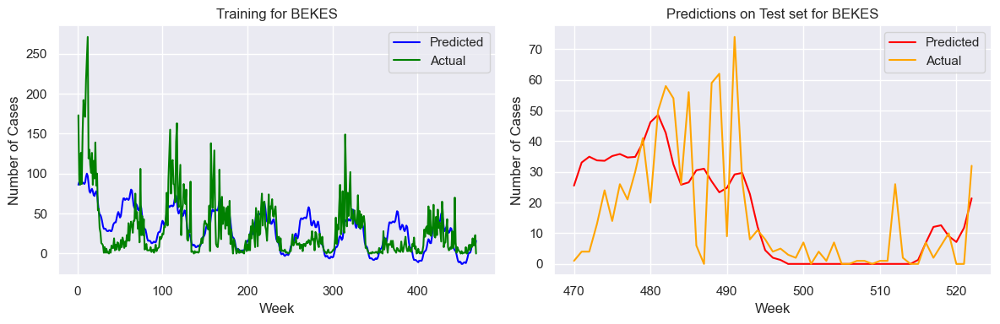

16:48:47 - cmdstanpy - INFO - Chain [1] start processing
16:48:47 - cmdstanpy - INFO - Chain [1] done processing


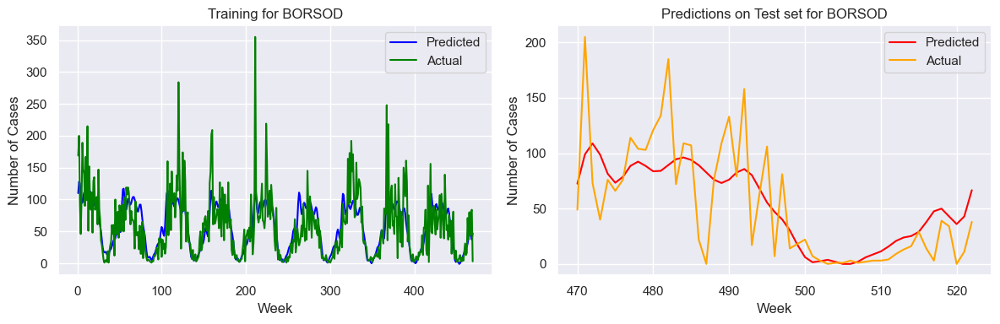

16:48:48 - cmdstanpy - INFO - Chain [1] start processing
16:48:48 - cmdstanpy - INFO - Chain [1] done processing


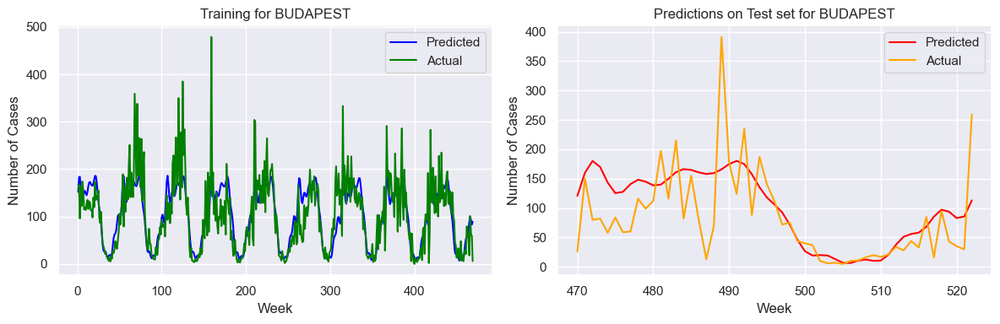

16:48:49 - cmdstanpy - INFO - Chain [1] start processing
16:48:49 - cmdstanpy - INFO - Chain [1] done processing


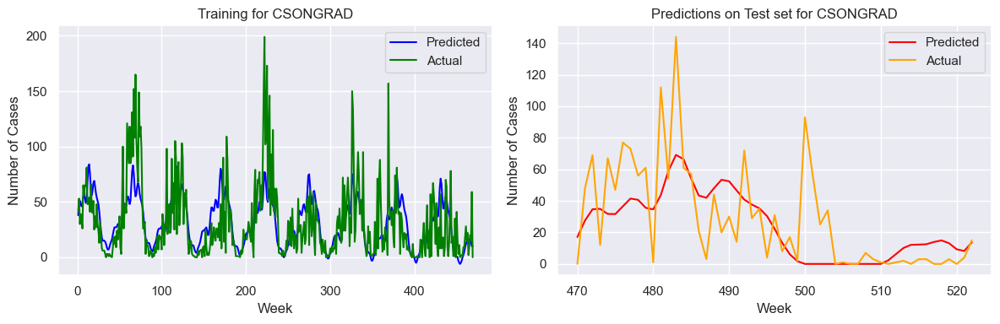

16:48:49 - cmdstanpy - INFO - Chain [1] start processing
16:48:50 - cmdstanpy - INFO - Chain [1] done processing


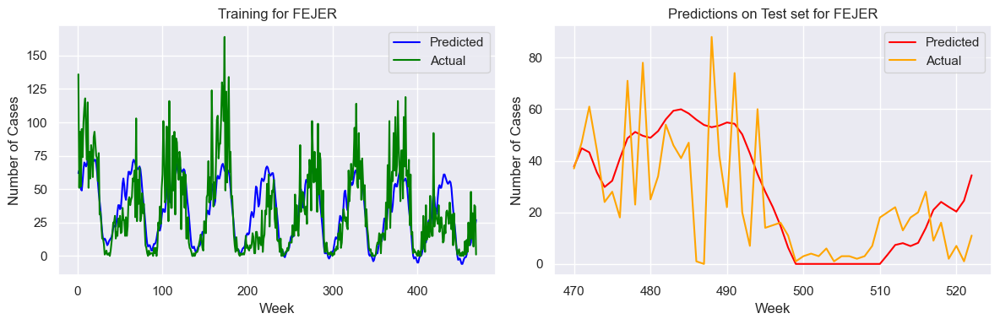

16:48:50 - cmdstanpy - INFO - Chain [1] start processing
16:48:50 - cmdstanpy - INFO - Chain [1] done processing


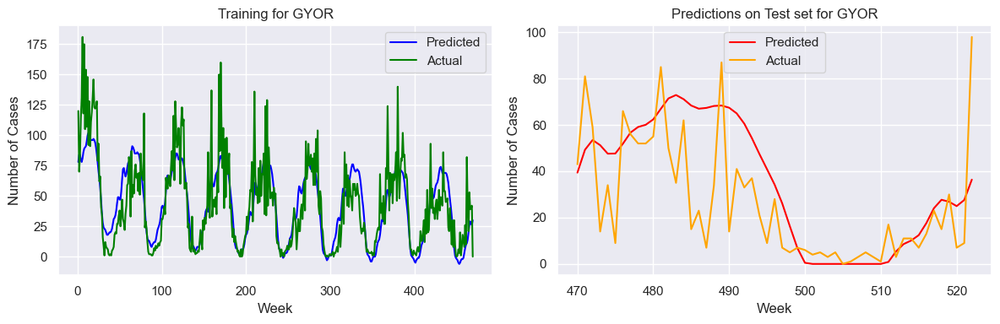

16:48:51 - cmdstanpy - INFO - Chain [1] start processing
16:48:51 - cmdstanpy - INFO - Chain [1] done processing


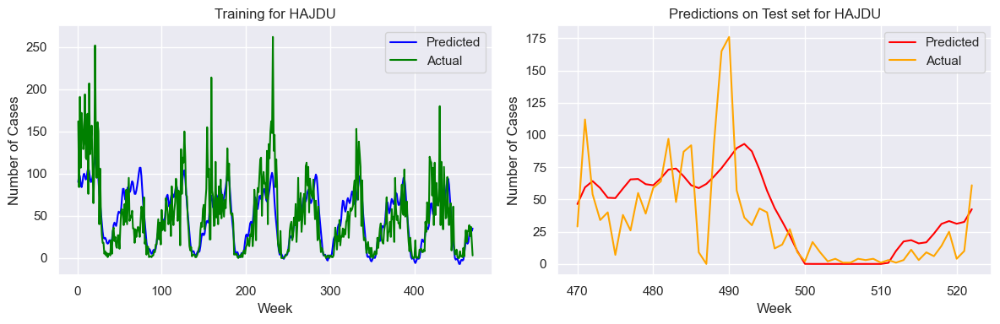

16:48:52 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing


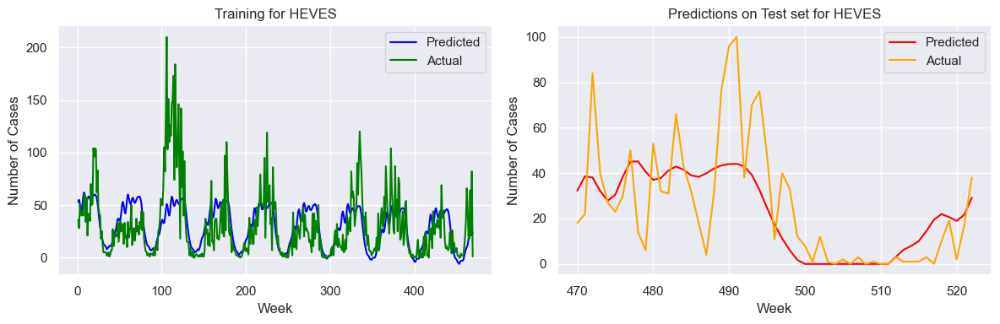

16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:48:53 - cmdstanpy - INFO - Chain [1] done processing


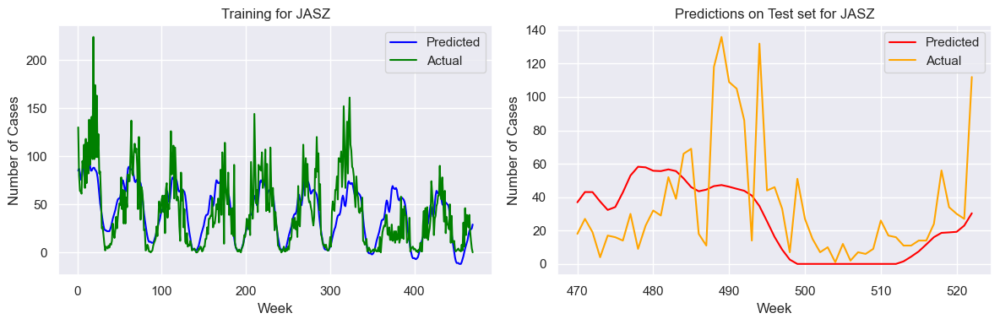

16:48:54 - cmdstanpy - INFO - Chain [1] start processing
16:48:54 - cmdstanpy - INFO - Chain [1] done processing


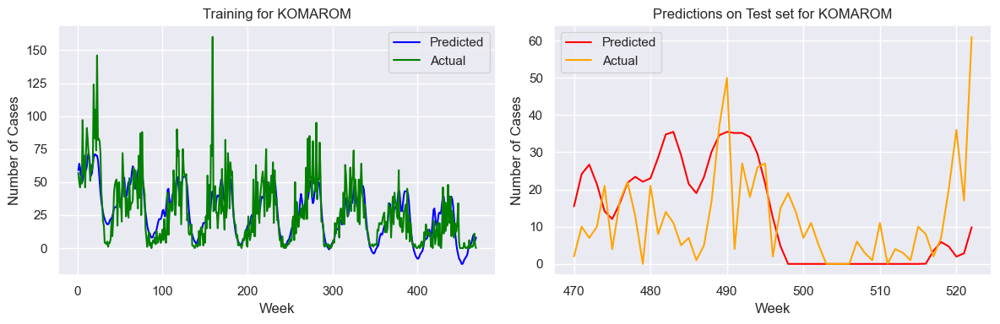

16:48:55 - cmdstanpy - INFO - Chain [1] start processing
16:48:55 - cmdstanpy - INFO - Chain [1] done processing


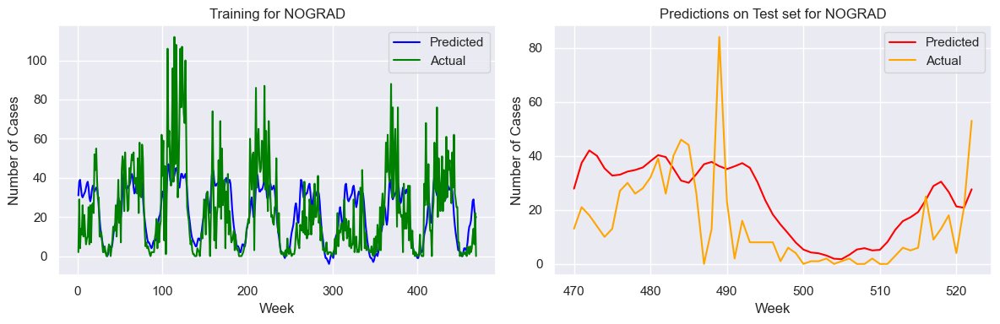

16:48:56 - cmdstanpy - INFO - Chain [1] start processing
16:48:56 - cmdstanpy - INFO - Chain [1] done processing


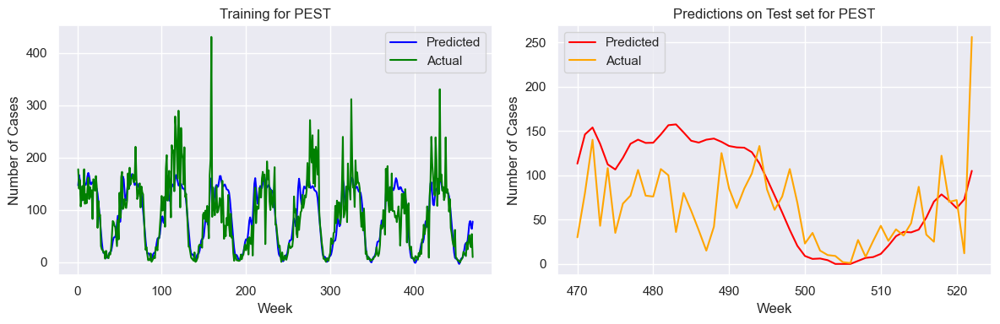

16:48:57 - cmdstanpy - INFO - Chain [1] start processing
16:48:57 - cmdstanpy - INFO - Chain [1] done processing


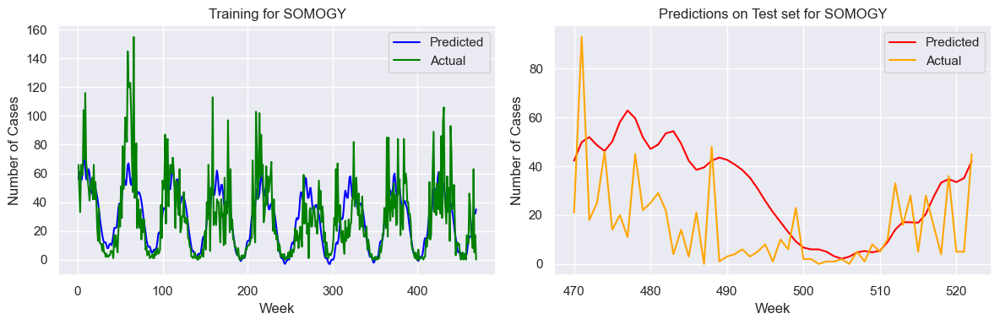

16:48:57 - cmdstanpy - INFO - Chain [1] start processing
16:48:58 - cmdstanpy - INFO - Chain [1] done processing


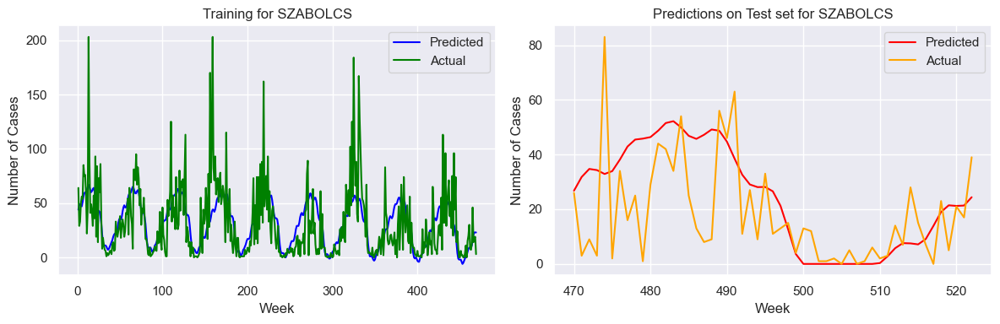

16:48:58 - cmdstanpy - INFO - Chain [1] start processing
16:48:58 - cmdstanpy - INFO - Chain [1] done processing


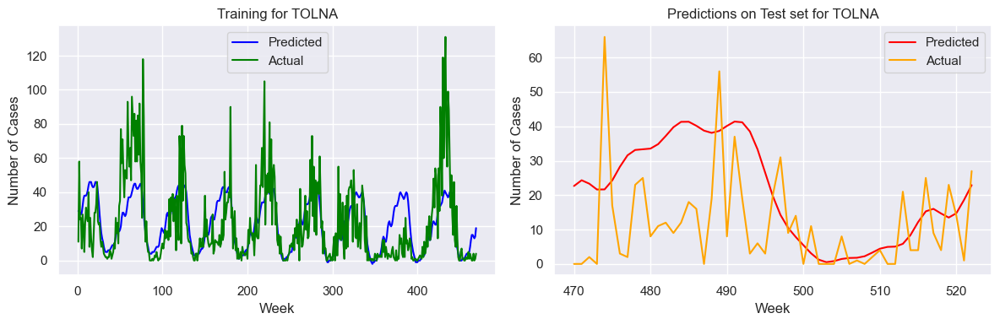

16:48:59 - cmdstanpy - INFO - Chain [1] start processing
16:48:59 - cmdstanpy - INFO - Chain [1] done processing


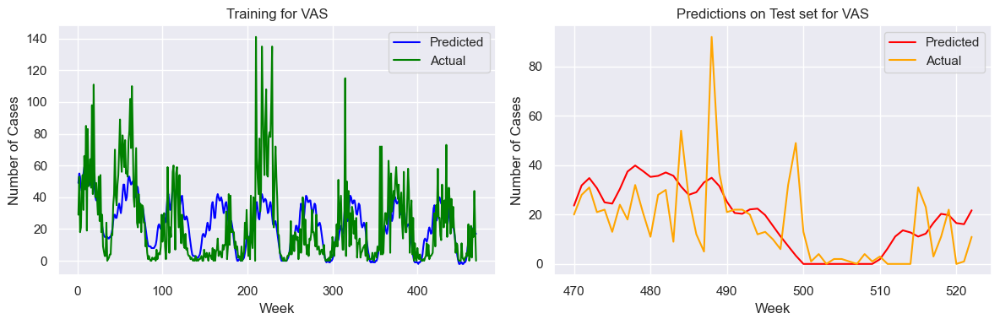

16:49:00 - cmdstanpy - INFO - Chain [1] start processing
16:49:00 - cmdstanpy - INFO - Chain [1] done processing


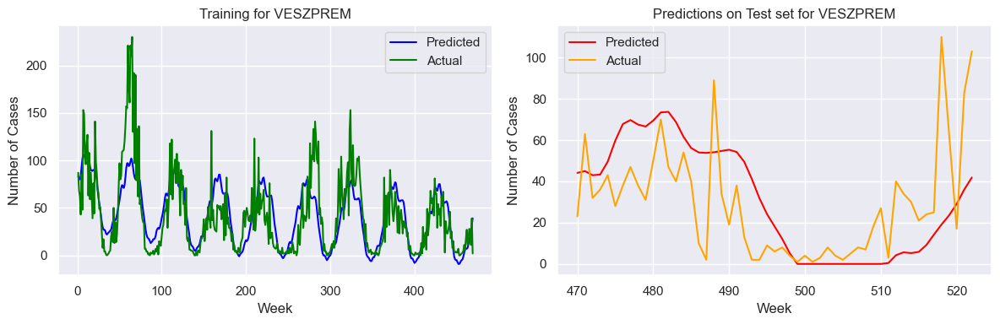

16:49:01 - cmdstanpy - INFO - Chain [1] start processing
16:49:01 - cmdstanpy - INFO - Chain [1] done processing


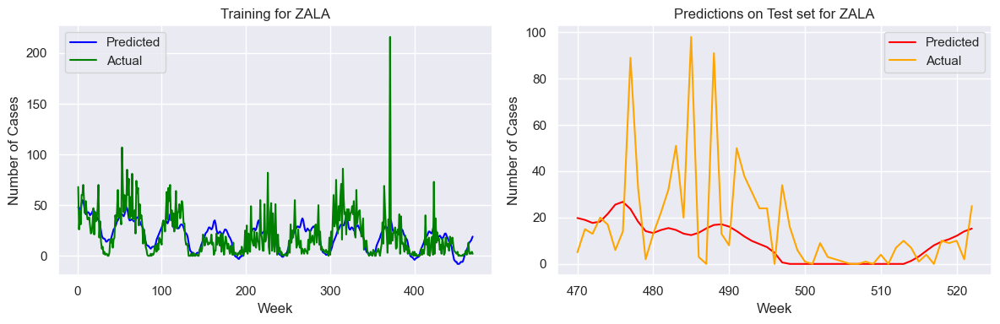

16:49:02 - cmdstanpy - INFO - Chain [1] start processing
16:49:02 - cmdstanpy - INFO - Chain [1] done processing


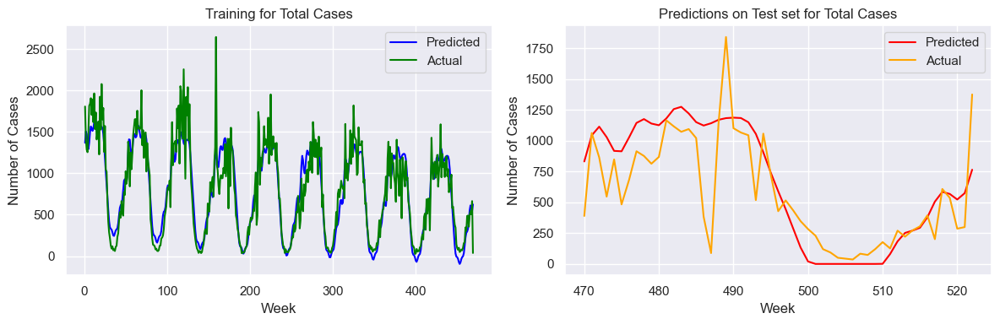

In [56]:
future_predictions = pd.DataFrame(test_set['Date'].to_list())
future_predictions.columns = ['Date']

train_rmse = 0
test_rmse = 0

total_train_rmse = 0
total_test_rmse = 0

for county in county_list:
    model = Prophet()
    
    df1 = train_set[['Date', county]]

    df1 = df1.rename(columns={county: 'y',
                            'Date': 'ds'})

    df1['ds'] = pd.to_datetime(df1['ds'], format='%d/%m/%Y', dayfirst=True)

    model.fit(df1)

    trained = pd.DataFrame(train_set['Date'])
    trained.columns = ['ds']

    trained['ds']= pd.to_datetime(trained['ds'], format='%d/%m/%Y')
    # use the model to make a forecast
    train_forecast = model.predict(trained)

    x_train = []

    for i in range(len(train_set)):
        x_train.append(i + 1)

    future = pd.DataFrame(test_set['Date'])
    future.columns = ['ds']

    future['ds']= pd.to_datetime(future['ds'], format='%d/%m/%Y')
    # use the model to make a forecast
    forecast = model.predict(future)

    forecast['yhat'] = forecast['yhat'].apply(lambda x: 0 if x < 0 else x)

    future_predictions[county] = forecast['yhat'].round()

    x_test = []

    for i in range(len(test_set)):
        x_test.append(i + len(train_set) + 1)

    if county != 'Total Cases':
        train_rmse += np.sqrt(mean_squared_error(train_forecast['yhat'].round(), train_set[county]))
        test_rmse += np.sqrt(mean_squared_error(forecast['yhat'], test_set[county]))
    else:
        total_train_rmse = np.sqrt(mean_squared_error(train_forecast['yhat'].round(), train_set[county]))
        total_test_rmse = np.sqrt(mean_squared_error(forecast['yhat'], test_set[county]))

    # First plot (Training)
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns

    # Plot for training data
    axs[0].plot(x_train, train_forecast['yhat'].round(), label='Predicted', color='blue')
    axs[0].plot(x_train, train_set[county], label='Actual', color='green')
    axs[0].set_title(f'Training for {county}')
    axs[0].legend()
    axs[0].set_xlabel('Week')  # Set x-axis label
    axs[0].set_ylabel('Number of Cases')  # Set y-axis label

    # Second plot (Test Predictions)
    axs[1].plot(x_test, forecast['yhat'], label='Predicted', color='red')
    axs[1].plot(x_test, test_set[county], label='Actual', color='orange')
    axs[1].set_title(f'Predictions on Test set for {county}')
    axs[1].legend()
    axs[1].set_xlabel('Week')  # Set x-axis label
    axs[1].set_ylabel('Number of Cases')  # Set y-axis label

    # Adjust layout to prevent overlapping titles
    plt.tight_layout()

    # Show the plots
    plt.show()

avg_train_rmse = train_rmse / (len(county_list) - 1)
avg_test_rmse = test_rmse / (len(county_list) - 1)

In [57]:
test_set.head()

,Week,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
469,470,30/12/2013,26,27,1,1,49,0,37,43,...,2,13,30,21,26,0,20,23,5,389
470,471,06/01/2014,150,49,4,4,205,48,47,81,...,10,21,80,93,3,0,28,63,15,1062
471,472,13/01/2014,80,50,41,4,73,69,61,59,...,7,18,140,18,9,2,31,32,13,864
472,473,20/01/2014,82,19,72,13,40,12,44,14,...,10,14,43,25,3,0,21,36,20,546
473,474,27/01/2014,58,24,41,24,76,67,24,34,...,21,10,108,46,83,66,22,43,17,848


In [58]:
future_predictions.head()

,Date,BACS,BARANYA,BEKES,BORSOD,BUDAPEST,CSONGRAD,FEJER,GYOR,HAJDU,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
0,30/12/2013,22.0,35.0,26.0,72.0,121.0,17.0,38.0,39.0,46.0,...,15.0,28.0,113.0,42.0,27.0,23.0,24.0,44.0,20.0,831.0
1,06/01/2014,28.0,40.0,33.0,99.0,160.0,27.0,45.0,49.0,59.0,...,24.0,37.0,146.0,50.0,32.0,24.0,32.0,45.0,19.0,1043.0
2,13/01/2014,30.0,44.0,35.0,109.0,180.0,35.0,43.0,53.0,64.0,...,27.0,42.0,154.0,52.0,35.0,23.0,35.0,43.0,18.0,1114.0
3,20/01/2014,26.0,45.0,34.0,99.0,170.0,35.0,35.0,51.0,59.0,...,21.0,40.0,135.0,49.0,34.0,22.0,31.0,43.0,18.0,1029.0
4,27/01/2014,23.0,44.0,34.0,81.0,143.0,32.0,30.0,48.0,51.0,...,14.0,35.0,112.0,46.0,33.0,22.0,25.0,50.0,22.0,917.0


In [59]:
print(f"Average train RMSE over the counties: {avg_train_rmse}\nAverage test RMSE over the counties: {avg_test_rmse}")
print(f"\nTrain RMSE for total cases: {total_train_rmse}, Test RMSE for Total Cases: {total_test_rmse}")

Average train RMSE over the counties: 25.518761262044034
Average test RMSE over the counties: 27.150607256935352

Train RMSE for total cases: 221.09552296956514, Test RMSE for Total Cases: 293.2607649239066


### XGBOOST

In [60]:
future_predictions = pd.DataFrame(test_set['Date'].to_list())
future_predictions.columns = ['Date']

model = XGBRegressor()

model.reg_alpha = 0.08  # L1 regularization term
model.reg_lambda = 0.1  # L2 regularization term
model.n_estimators = 1000
model.early_stopping_rounds = 50

y_train = train_set[[county for county in county_list]]

y_test = test_set[[county for county in county_list]]

model.fit(np.reshape(x_train, (len(x_train), 1)), y_train,
        eval_set=[(np.reshape(x_train, (len(x_train), 1)), y_train), (np.reshape(x_test, (len(x_test), 1)), y_test)],
        verbose=False)

train_forecast = model.predict(np.reshape(x_train, (len(x_train), 1))).round()

predictions = model.predict(np.reshape(x_test, (len(x_test), 1))).round()

In [61]:
train_forecast = pd.DataFrame(train_forecast, columns=county_list)
predictions = pd.DataFrame(predictions, columns=county_list)

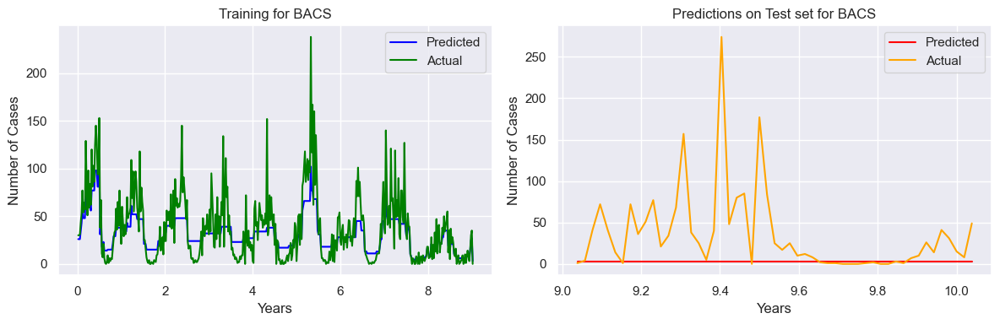

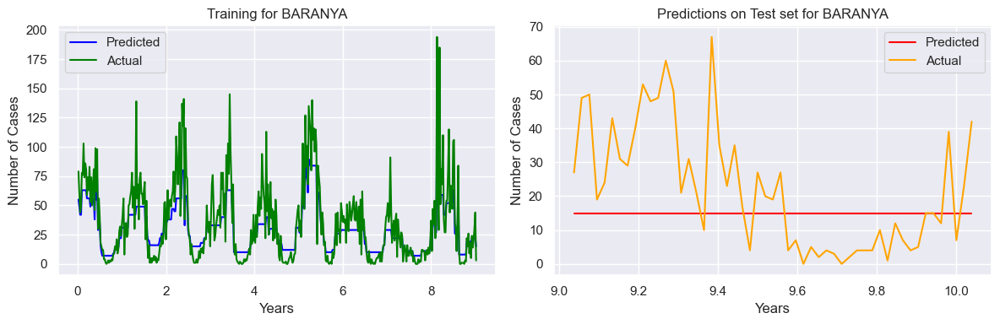

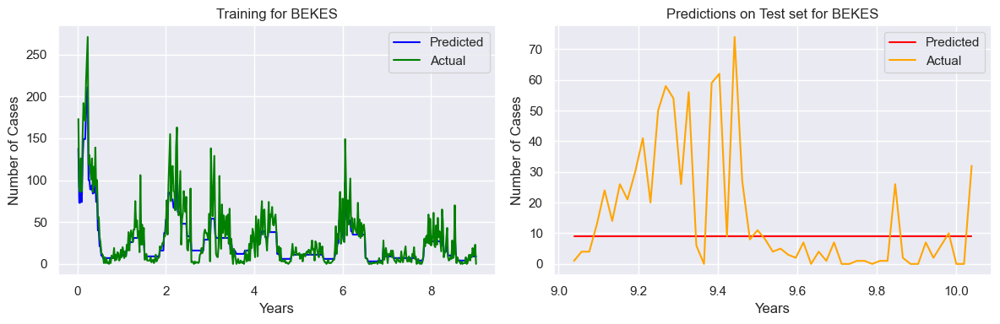

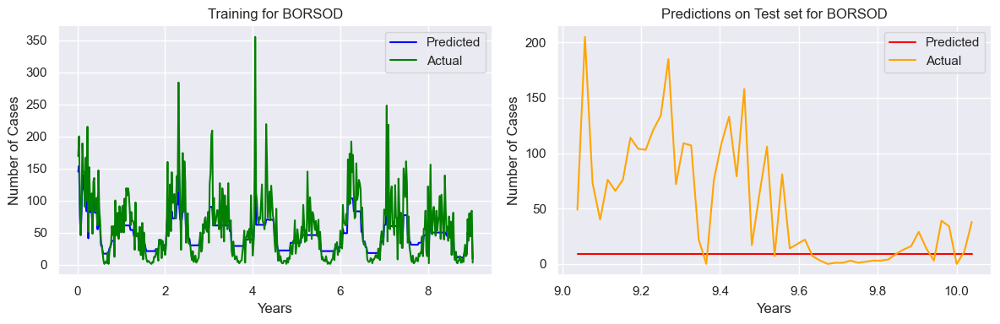

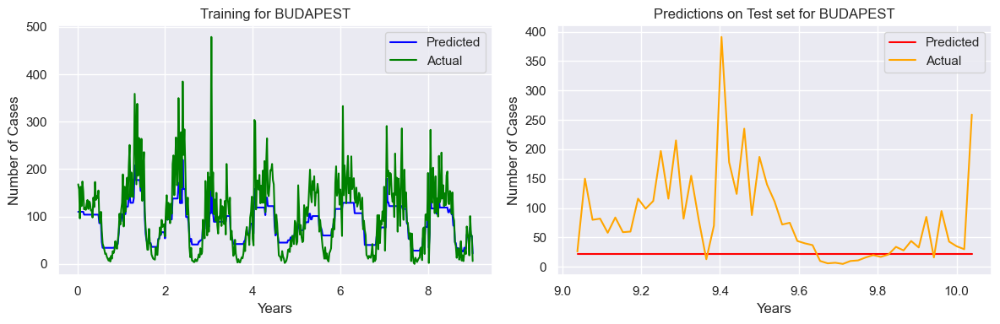

...

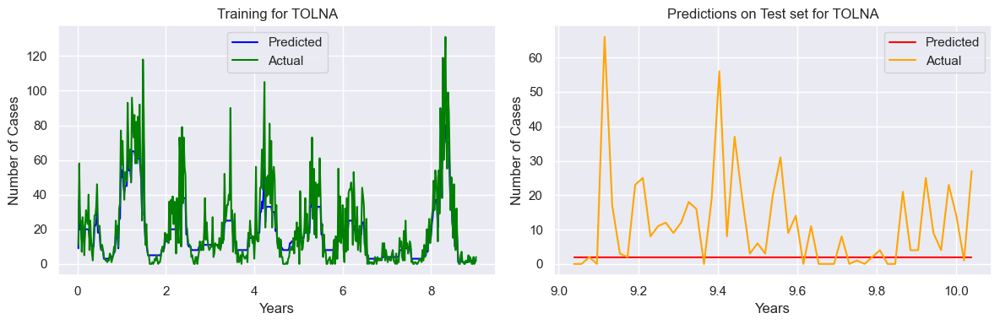

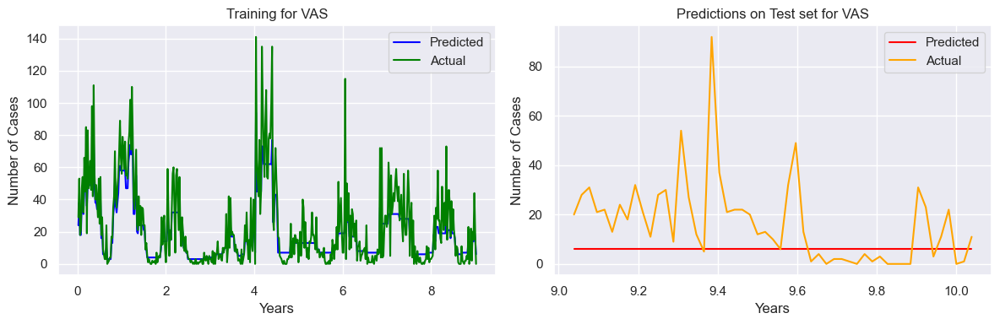

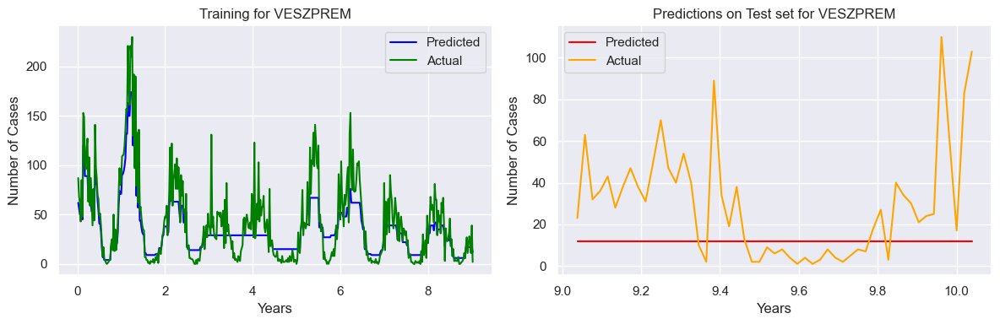

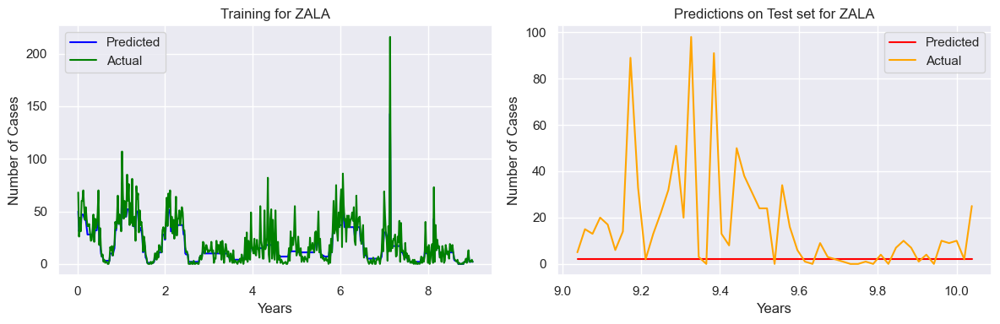

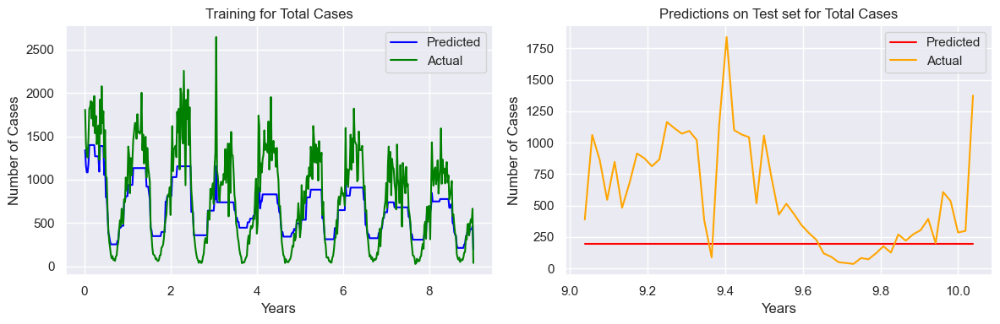

In [62]:
avg_train_rmse = 0
avg_test_rmse = 0

for county in county_list:

    if county != 'Total Cases':
        avg_train_rmse += np.sqrt(mean_squared_error(train_set[county], train_forecast[county])) / (len(county_list) - 1)
        avg_test_rmse += np.sqrt(mean_squared_error(test_set[county], predictions[county])) / (len(county_list) - 1)
    else:
        total_train_rmse = np.sqrt(mean_squared_error(train_set[county], train_forecast[county]))
        total_test_rmse = np.sqrt(mean_squared_error(test_set[county], predictions[county]))

    # First plot (Training)
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns

    # Plot for training data
    axs[0].plot([num/52 for num in x_train], train_forecast[county].to_list(), label='Predicted', color='blue')
    axs[0].plot([num/52 for num in x_train], train_set[county].to_list(), label='Actual', color='green')  # Customize color
    axs[0].set_title(f'Training for {county}')
    axs[0].legend()
    axs[0].set_xlabel('Years')
    axs[0].set_ylabel('Number of Cases')

    # Second plot (Test Predictions)
    axs[1].plot([num/52 for num in x_test], predictions[county].to_list(), label='Predicted', color='red')
    axs[1].plot([num/52 for num in x_test], test_set[county].to_list(), label='Actual', color='orange')
    axs[1].set_title(f'Predictions on Test set for {county}')
    axs[1].set_xlabel('Years')
    axs[1].set_ylabel('Number of Cases')
    axs[1].legend()

    # Adjust layout to prevent overlapping titles
    plt.tight_layout()

    # Show the plots
    plt.show()

In [63]:
train_set.head()

,Week,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
0,1,03/01/2005,168,79,30,173,169,42,136,120,...,57,2,178,66,64,11,29,87,68,1807
1,2,10/01/2005,157,60,30,92,200,53,51,70,...,50,29,141,48,29,58,53,68,26,1407
2,3,17/01/2005,96,44,31,86,93,30,93,84,...,46,4,157,33,33,24,18,62,44,1284
3,4,24/01/2005,163,49,43,126,46,39,52,114,...,54,14,107,66,50,25,21,43,31,1255
4,5,31/01/2005,122,78,53,87,103,34,95,131,...,49,11,124,63,56,7,47,85,60,1478


In [64]:
train_forecast.head()

,BACS,BARANYA,BEKES,BORSOD,BUDAPEST,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
0,26.0,55.0,138.0,145.0,110.0,37.0,108.0,94.0,127.0,30.0,...,44.0,6.0,105.0,44.0,47.0,9.0,24.0,62.0,50.0,1341.0
1,26.0,49.0,73.0,154.0,110.0,37.0,43.0,61.0,79.0,28.0,...,42.0,12.0,105.0,44.0,29.0,37.0,38.0,56.0,31.0,1154.0
2,26.0,42.0,73.0,72.0,110.0,28.0,69.0,70.0,141.0,36.0,...,42.0,12.0,105.0,37.0,29.0,20.0,18.0,50.0,35.0,1084.0
3,35.0,42.0,98.0,46.0,110.0,28.0,50.0,92.0,110.0,36.0,...,42.0,12.0,90.0,48.0,38.0,20.0,18.0,50.0,32.0,1084.0
4,43.0,63.0,74.0,85.0,110.0,28.0,70.0,113.0,124.0,36.0,...,42.0,12.0,99.0,48.0,43.0,14.0,40.0,60.0,47.0,1182.0


In [65]:
test_set.head()

,Week,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
469,470,30/12/2013,26,27,1,1,49,0,37,43,...,2,13,30,21,26,0,20,23,5,389
470,471,06/01/2014,150,49,4,4,205,48,47,81,...,10,21,80,93,3,0,28,63,15,1062
471,472,13/01/2014,80,50,41,4,73,69,61,59,...,7,18,140,18,9,2,31,32,13,864
472,473,20/01/2014,82,19,72,13,40,12,44,14,...,10,14,43,25,3,0,21,36,20,546
473,474,27/01/2014,58,24,41,24,76,67,24,34,...,21,10,108,46,83,66,22,43,17,848


In [66]:
predictions.head()

,BACS,BARANYA,BEKES,BORSOD,BUDAPEST,CSONGRAD,FEJER,GYOR,HAJDU,HEVES,...,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA,Total Cases
0,3.0,15.0,9.0,9.0,22.0,4.0,8.0,19.0,10.0,6.0,...,0.0,0.0,14.0,8.0,9.0,2.0,6.0,12.0,2.0,193.0
1,3.0,15.0,9.0,9.0,22.0,4.0,8.0,19.0,10.0,6.0,...,0.0,0.0,14.0,8.0,9.0,2.0,6.0,12.0,2.0,193.0
2,3.0,15.0,9.0,9.0,22.0,4.0,8.0,19.0,10.0,6.0,...,0.0,0.0,14.0,8.0,9.0,2.0,6.0,12.0,2.0,193.0
3,3.0,15.0,9.0,9.0,22.0,4.0,8.0,19.0,10.0,6.0,...,0.0,0.0,14.0,8.0,9.0,2.0,6.0,12.0,2.0,193.0
4,3.0,15.0,9.0,9.0,22.0,4.0,8.0,19.0,10.0,6.0,...,0.0,0.0,14.0,8.0,9.0,2.0,6.0,12.0,2.0,193.0


In [67]:
print(f"Average train RMSE over the counties: {avg_train_rmse}\nAverage test RMSE over the counties: {avg_test_rmse}")
print(f"\nTrain RMSE for total cases: {total_train_rmse}, Test RMSE for Total Cases: {total_test_rmse}")

Average train RMSE over the counties: 20.983975664395114
Average test RMSE over the counties: 36.35497176588536

Train RMSE for total cases: 330.6104291511982, Test RMSE for Total Cases: 570.7152910131516


### XGBOOST implemented with sliding window approach:

In [68]:
future_predictions = pd.DataFrame(test_set['Date'][1:])
future_predictions.columns = ['Date']

future_predictions.head()

,Date
470,06/01/2014
471,13/01/2014
472,20/01/2014
473,27/01/2014
474,03/02/2014


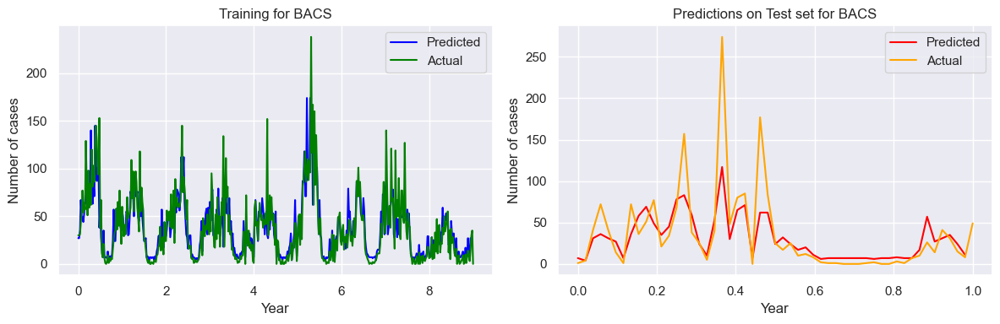

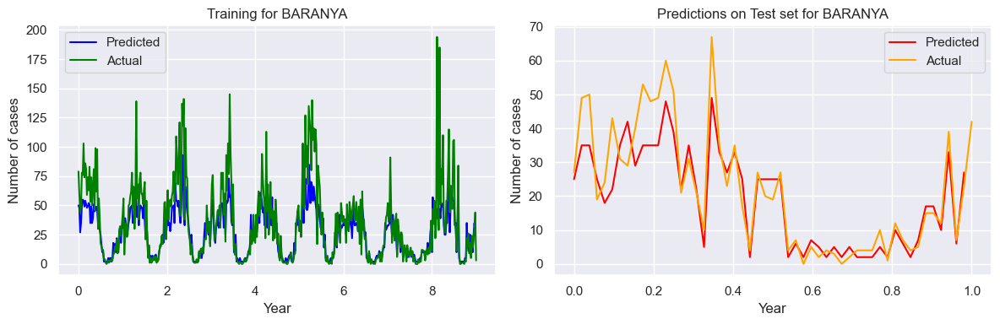

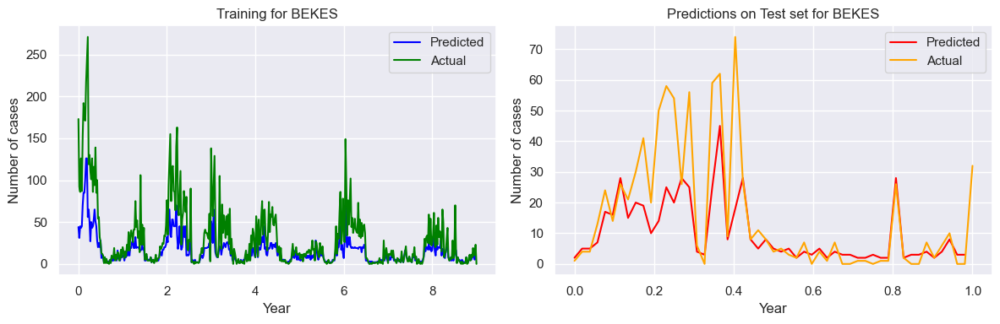

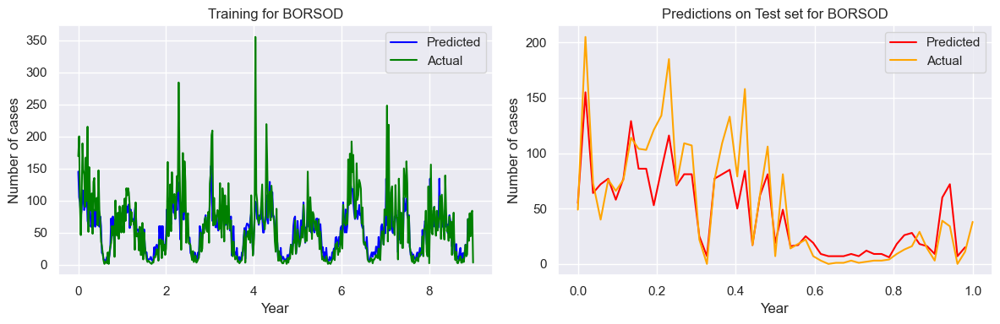

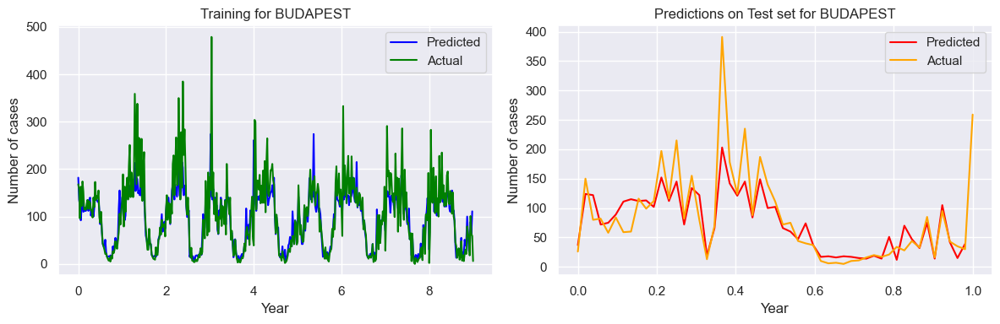

...

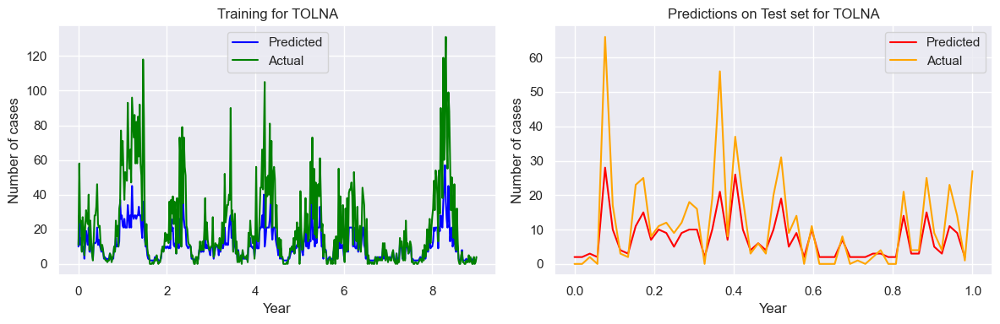

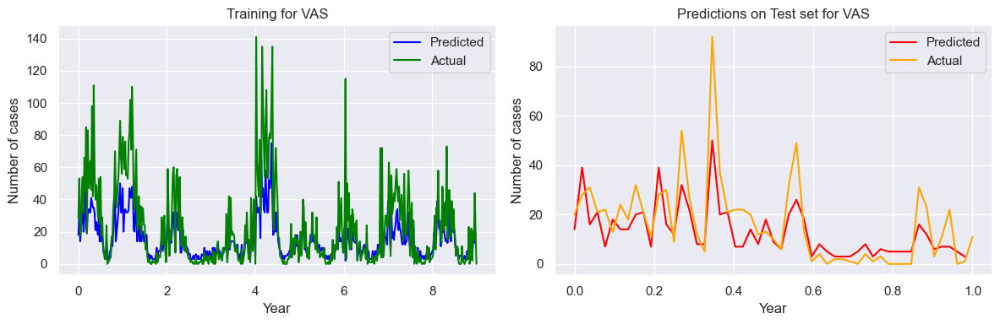

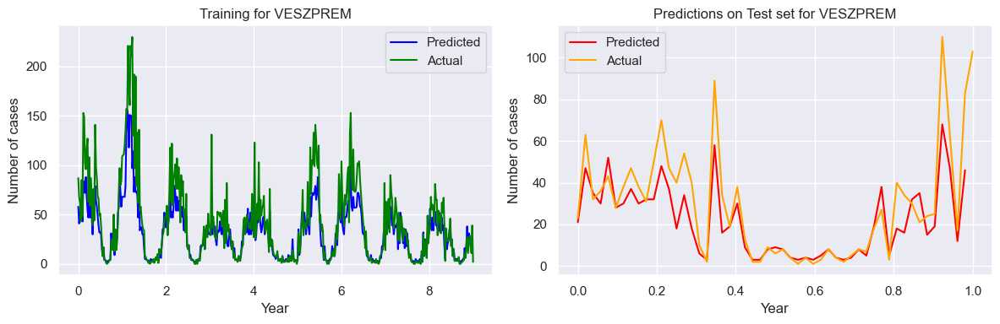

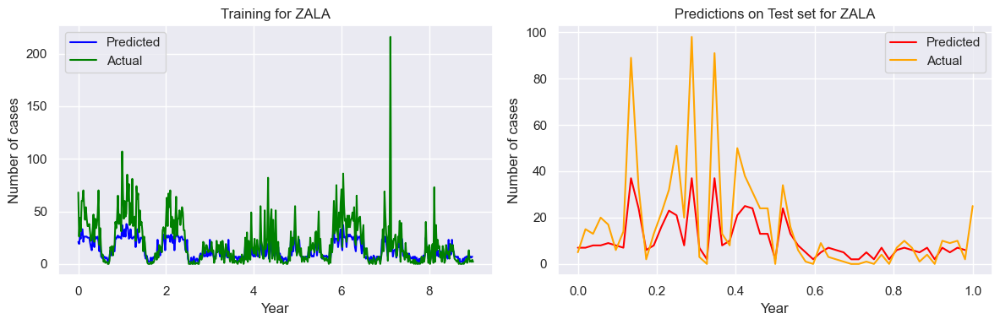

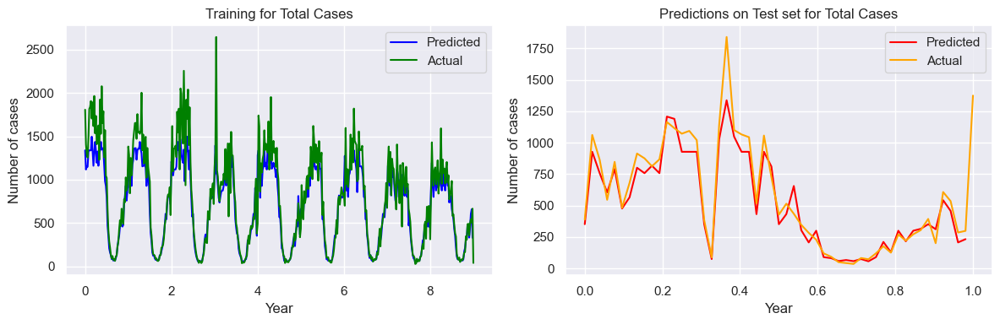

In [69]:
# Initialize a variable to store the sum of RMSE values
avg_train_rmse = 0
avg_test_rmse = 0

for county in county_list:
    model = XGBRegressor()

    model.reg_alpha = 0.05  # L1 regularization term
    model.reg_lambda = 0.1  # L2 regularization term
    model.n_estimators = 1000
    model.early_stopping_rounds = 50

    x_train = np.array(train_set[county])[:-1]
    y_train = np.array(train_set[county])[1:]

    x_test = np.array(test_set[county])[:-1]
    y_test = np.array(test_set[county])[1:]

    model.fit(np.reshape(x_train, (len(x_train), 1)), y_train,
              eval_set=[(np.reshape(x_train, (len(x_train), 1)), y_train),
                        (np.reshape(x_test, (len(x_test), 1)), y_test)],
              verbose=False)

    train_forecast = model.predict(np.reshape(x_train, (len(x_train), 1))).round()
    predictions = model.predict(np.reshape(x_test, (len(x_test), 1))).round()

    # Add predictions to the DataFrame
    future_predictions[county] = predictions

    if county != 'Total Cases':
        # Calculate RMSE for the current county
        avg_train_rmse += np.sqrt(mean_squared_error(y_train, train_forecast))
        avg_test_rmse += np.sqrt(mean_squared_error(y_test, predictions))
    else:
        total_train_rmse = np.sqrt(mean_squared_error(y_train, train_forecast))
        total_test_rmse = np.sqrt(mean_squared_error(y_test, predictions))

    # Plot the results
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    # Plot for training data
    axs[0].plot([num / 52 for num in range(len(x_train))], train_forecast, label='Predicted', color='blue')
    axs[0].plot([num / 52 for num in range(len(train_set[county]))], train_set[county], label='Actual', color='green')
    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Number of cases')
    axs[0].legend()
    axs[0].set_title(f'Training for {county}')

    # Second plot (Test Predictions)
    axs[1].plot([num / 52 for num in range(len(x_test))], predictions, label='Predicted', color='red')
    axs[1].plot([num / 52 for num in range(len(x_test) + 1)], test_set[county], label='Actual', color='orange')
    axs[1].set_title(f'Predictions on Test set for {county}')
    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Number of cases')
    axs[1].legend()

    # Adjust layout to prevent overlapping titles
    plt.tight_layout()

    # Show the plots
    plt.show()

# Calculate and print the average RMSE across all counties
avg_test_rmse = avg_test_rmse / (len(county_list) - 1)
avg_train_rmse = avg_train_rmse / (len(county_list) - 1)

In [70]:
print(f"Average train RMSE over the counties: {avg_train_rmse}\nAverage test RMSE over the counties: {avg_test_rmse}")
print(f"\nTrain RMSE for total cases: {total_train_rmse}, Test RMSE for Total Cases: {total_test_rmse}")

Average train RMSE over the counties: 25.025537933551483
Average test RMSE over the counties: 28.107080740210268

Train RMSE for total cases: 227.61356703289, Test RMSE for Total Cases: 332.4574003942807
